<a href="https://colab.research.google.com/github/rahmaum/aumiya/blob/main/Group_M_GFP_Wine_Tasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Overview Dataset



# Library

In [ ]:
from datetime import datetime
from wordcloud import WordCloud, STOPWORDS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px 
import plotly.figure_factory as ff
import seaborn as sns 

# Importing Data

Maturity dataset : https://drive.google.com/file/d/1-SB2v84yN8qXsZaCPMwzXYqCXFQRj0RS/view?usp=share_link

* This datasets created from https://www.winemag.com/wine-vintage-chart/
* You need to register email to view the chart
* In browser, view page source or press F12. 
* Find < table> < /table> tag
* copy the entire code, then paste in : https://htmltidy.net/ to transform the code to paste in csv file.
* The cleaned datasets can be found in : https://docs.google.com/spreadsheets/d/1ms5HUBClWlNK35PGao9Ggr3hMLakKRgZ/edit#gid=1668776906  
* This cleaned datasets will use on merge data


Wine tasting dataset : https://drive.google.com/file/d/1uOwgOVDTIDeiu3dDT-fXvkLGUH30n3qx/view?usp=share_link

* source from website https://www.mavenanalytics.io/data-playground?page=5

## Maturity dataset
This data contain html code. using RegEx, we will extract the record. at the end, we will remove all row that contain NaN data.

In [ ]:
## Maturity Dataset

potter_url = 'https://drive.google.com/file/d/1-SB2v84yN8qXsZaCPMwzXYqCXFQRj0RS/view?usp=sharing'
potter = 'https://drive.google.com/uc?id='+ potter_url.split('/')[-2]

df = pd.read_csv(potter)
df_html = df.copy()
df_html.head()

,html_code
0,"<tbody class=""tbody-esque"">"
1,"<tr class=""tr-esque region-holder"">"
2,"<td class=""th-esque region-title"" colspan=""2"">..."
3,</tr>
4,"<tr class=""tr-esque"">"


In [ ]:
df_score = pd.DataFrame(columns=['region'])
#region-title
df_score['region'] = df_html['html_code'].str.extract(r'<td class="th-esque region-title" colspan="2">(.*)</td>')

#province
df_score['province'] = df_html['html_code'].str.extract(r'<td class="th-esque index-1">(.*)</td>')

#grape_variance
df_score['grape'] = df_html['html_code'].str.extract(r'<td class="th-esque index-2" style="left: 99.963px;">(.*)</td>')

#year
df_score['year'] = df_html['html_code'].str.extract(r'(\b\d{4}\b)')

#color
df_score['color'] = df_html['html_code'].str.extract(r'data-color="(.*)">')

#score
temp = df_html['html_code'].str[-7:]
temp2 = temp.str.split('</td>').str[0]
pd.to_numeric(temp2, errors='coerce').fillna(0)
df_score['score'] = pd.to_numeric(temp2, errors='coerce').fillna(0)

df_score['region'].fillna(method='ffill', axis=0, inplace=True)
df_score['province'].fillna(method='ffill', axis=0, inplace=True)
df_score['grape'].fillna(method='ffill', axis=0, inplace=True)

df_maturity = df_score.dropna(axis=0,inplace=False)
df_maturity = df_maturity.reset_index()
df_maturity.head()

,index,region,province,grape,year,color,score
0,7,CALIFORNIA,Napa,Chardonnay,2020,OtherGray,0.0
1,8,CALIFORNIA,Napa,Chardonnay,2019,Red,92.0
2,9,CALIFORNIA,Napa,Chardonnay,2018,Red,93.0
3,10,CALIFORNIA,Napa,Chardonnay,2017,Red,90.0
4,11,CALIFORNIA,Napa,Chardonnay,2016,Teal,94.0


## Wine tasting dataset

The plans is combine this dataset with dataset above. US coutry wine are the most country that have variety and review, we will focus US wine only.

In [ ]:
## Wine Tasting review Dataset

potter_url = 'https://drive.google.com/file/d/1uOwgOVDTIDeiu3dDT-fXvkLGUH30n3qx/view?usp=sharing'
potter = 'https://drive.google.com/uc?id='+ potter_url.split('/')[-2]

df = pd.read_csv(potter)
df_wine = df.copy()
df_wine['id'] = df_wine['id'].astype(str)
df_wine.head()

,id,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks


In [ ]:
df_wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     129971 non-null  object 
 1   country                129908 non-null  object 
 2   description            129971 non-null  object 
 3   designation            92506 non-null   object 
 4   points                 129971 non-null  int64  
 5   price                  120975 non-null  float64
 6   province               129908 non-null  object 
 7   region_1               108724 non-null  object 
 8   region_2               50511 non-null   object 
 9   taster_name            103727 non-null  object 
 10  taster_twitter_handle  98758 non-null   object 
 11  title                  129971 non-null  object 
 12  variety                129970 non-null  object 
 13  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(12)


In [ ]:
df_wine['country'].value_counts().head(15)

US              54504
France          22093
Italy           19540
Spain            6645
Portugal         5691
Chile            4472
Argentina        3800
Austria          3345
Australia        2329
Germany          2165
New Zealand      1419
South Africa     1401
Israel            505
Greece            466
Canada            257
Name: country, dtype: int64

In [ ]:
df_wine[df_wine['country'] == 'Germany'].head(10)

,id,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
8,8,Germany,Savory dried thyme notes accent sunnier flavor...,Shine,87,12.0,Rheinhessen,NaN,NaN,Anna Lee C. Iijima,NaN,Heinz Eifel 2013 Shine Gewürztraminer (Rheinhe...,Gewürztraminer,Heinz Eifel
15,15,Germany,Zesty orange peels and apple notes abound in t...,Devon,87,24.0,Mosel,NaN,NaN,Anna Lee C. Iijima,NaN,Richard Böcking 2013 Devon Riesling (Mosel),Riesling,Richard Böcking
76,76,Germany,Earthy pollen and mineral notes lend a savory ...,NaN,86,9.0,Rheinhessen,NaN,NaN,Anna Lee C. Iijima,NaN,Schmitt Söhne 2015 Riesling (Rheinhessen),Riesling,Schmitt Söhne
85,85,Germany,"Pronounced dust, pollen and earth tones lend s...",Undone Dry,86,10.0,Rheinhessen,NaN,NaN,Anna Lee C. Iijima,NaN,P.J. Valckenberg 2015 Undone Dry Riesling (Rhe...,Riesling,P.J. Valckenberg
148,148,Germany,"Crisp, pristine peach and apricot notes resona...",Dry,91,16.0,Rheinhessen,NaN,NaN,Anna Lee C. Iijima,NaN,Weingut Liebfrauenstift 2014 Dry Riesling (Rhe...,Riesling,Weingut Liebfrauenstift
156,156,Germany,Approachably fruity yet nuanced and electrifyi...,Graacher Himmelreich Spätlese,91,14.0,Mosel,NaN,NaN,Anna Lee C. Iijima,NaN,Carl Graff 2014 Graacher Himmelreich Spätlese ...,Riesling,Carl Graff
170,170,Germany,"Fresh and fragrant of blossoms, tart yellow pe...",Brauneberger Feinherb,91,30.0,Mosel,NaN,NaN,Anna Lee C. Iijima,NaN,Fritz Haag 2014 Brauneberger Feinherb Riesling...,Riesling,Fritz Haag
171,171,Germany,Just a touch of honey-lemon sweetness is enoug...,NaN,91,22.0,Mosel,NaN,NaN,Anna Lee C. Iijima,NaN,Fritz Haag 2014 Riesling (Mosel),Riesling,Fritz Haag
347,347,Germany,"Dusty, saffron-spiced earthiness is juxtaposed...",Kiedrich Gräfenberg Trockenbeerenauslese,97,775.0,Rheingau,NaN,NaN,Anna Lee C. Iijima,NaN,Robert Weil 2014 Kiedrich Gräfenberg Trockenbe...,Riesling,Robert Weil
354,354,Germany,"Whiffs of white mushroom, saffron and caramel ...",Kiedrich Gräfenberg Beerenauslese,96,365.0,Rheingau,NaN,NaN,Anna Lee C. Iijima,NaN,Robert Weil 2014 Kiedrich Gräfenberg Beerenaus...,Riesling,Robert Weil


In [ ]:
data = df_wine[['id','country']].copy()
data = data['country'].value_counts().head(10)
#data['value'] = 1
fig = px.bar(data, y='country',text_auto=True)
fig.update_layout(title_text="Top 10 country with wine taste review")
fig.show()

# Exporting to Excel

In [ ]:
# excel_data = df_wine.copy()
# excel_data = df_wine[['id','country','price','points','title','variety']].copy()
# excel_data.info()
# file_name = 'winemag_data_all.xlsx'
  
# #saving the excel
# excel_data.to_excel(file_name)
# print('DataFrame is written to Excel File successfully. Find it on File tab in left window, refresh it if needed')

In [ ]:
# excel_data = df_wine[df_wine['country'] == 'US'].copy()
# excel_data = df_wine.copy()
# file_name = 'winemag_data_all.xlsx'
  
# # saving the excel
# excel_data.to_excel(file_name)
# print('DataFrame is written to Excel File successfully. Find it on File tab in left window, refresh it if needed')

In [ ]:
filter = df_wine['country'].isin(['US','France','Italy'])
df_wine[filter].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96137 entries, 0 to 129970
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     96137 non-null  object 
 1   country                96137 non-null  object 
 2   description            96137 non-null  object 
 3   designation            65327 non-null  object 
 4   points                 96137 non-null  int64  
 5   price                  88955 non-null  float64
 6   province               96137 non-null  object 
 7   region_1               95756 non-null  object 
 8   region_2               50511 non-null  object 
 9   taster_name            70600 non-null  object 
 10  taster_twitter_handle  67611 non-null  object 
 11  title                  96137 non-null  object 
 12  variety                96137 non-null  object 
 13  winery                 96137 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 11.

# A. Data Cleaning
From wine dataset, we want to filter the record which country is US only.

In [ ]:
filter = df_wine['country'].isin(['US'])
df_wine_us = df_wine[filter].copy()
#df_wine_us.drop('id', axis=1, inplace=True)
df_wine_us = df_wine_us.reset_index()
df_wine_us.drop('index', axis=1, inplace=True)
df_wine_us.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54504 entries, 0 to 54503
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     54504 non-null  object 
 1   country                54504 non-null  object 
 2   description            54504 non-null  object 
 3   designation            36908 non-null  object 
 4   points                 54504 non-null  int64  
 5   price                  54265 non-null  float64
 6   province               54504 non-null  object 
 7   region_1               54226 non-null  object 
 8   region_2               50511 non-null  object 
 9   taster_name            37730 non-null  object 
 10  taster_twitter_handle  34741 non-null  object 
 11  title                  54504 non-null  object 
 12  variety                54504 non-null  object 
 13  winery                 54504 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 5.8+

Before cleaning we have 54.504 record

In [ ]:
df_wine_us.head()

,id,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
2,4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks
3,10,US,"Soft, supple plum envelopes an oaky structure ...",Mountain Cuvée,87,19.0,California,Napa Valley,Napa,Virginie Boone,@vboone,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature
4,12,US,"Slightly reduced, this wine offers a chalky, t...",NaN,87,34.0,California,Alexander Valley,Sonoma,Virginie Boone,@vboone,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini


## Handle missing value
From all the column in this datasets, the column that mandatory or cant have missing values are:

* country
* description
* point
* price
* twitter_account
* title
* province
* region_2
* variety

so we will remove the row that doest have that data.

In [ ]:
df_wine_us_no_NaN = df_wine_us.copy()
#Country 54.504 row
df_wine_us_no_NaN.dropna(subset=['country'], inplace=True)

#Description 54.504 row
df_wine_us_no_NaN.dropna(subset=['description'], inplace=True)

#Point 54.504 row
df_wine_us_no_NaN.dropna(subset=['points'], inplace=True)

#Price 54.265 row
#239 row deleted
#0.4% data deleted
df_wine_us_no_NaN.dropna(subset=['price'], inplace=True)

#taster_twitter_handle 54.265 row
#19.730 row has missing value
#change to No Account
#36.2% data changes
df_wine_us_no_NaN[['taster_twitter_handle']] = df_wine_us_no_NaN[['taster_twitter_handle']].fillna(value='No Account')
df_wine_us_no_NaN[['taster_name']] = df_wine_us_no_NaN[['taster_name']].fillna(value='No Account')

#designation 54.265 row
#17.514 row has missing value
#change to No Name
#32.1% data changes
df_wine_us_no_NaN[['designation']] = df_wine_us_no_NaN[['designation']].fillna(value='No Name')

#region_2 54.265 row
#3.973 row has missing value
#7.2% data deleted
df_wine_us_no_NaN.dropna(subset=['region_2'], inplace=True)

#filtered_df = df_wine_us_no_NaN[df_wine_us_no_NaN['region_2'].isnull()]
#filtered_df
df_wine_us_no_NaN.info()
#df_wine_us.dropna(subset=['country', 'description','designation','points','price','taster_twitter_handle','title','variety','region_2'])

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50292 entries, 0 to 54503
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     50292 non-null  object 
 1   country                50292 non-null  object 
 2   description            50292 non-null  object 
 3   designation            50292 non-null  object 
 4   points                 50292 non-null  int64  
 5   price                  50292 non-null  float64
 6   province               50292 non-null  object 
 7   region_1               50292 non-null  object 
 8   region_2               50292 non-null  object 
 9   taster_name            50292 non-null  object 
 10  taster_twitter_handle  50292 non-null  object 
 11  title                  50292 non-null  object 
 12  variety                50292 non-null  object 
 13  winery                 50292 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 5.8+

After deleted missing value or change to name the record. we have 50.292 record data, (7.7% data deleted)

## Get Year

In Title, there a information about Grape variety, winery and year the grape are harvest. Using RegEx we can get the year.

In [ ]:
df_wine_year = df_wine_us_no_NaN.copy()
# using RegEx to get 4 digit number
# remove year with nan value
df_wine_year['year'] = df_wine_year['title'].str.extract(r'(\b\d{4}\b)')
df_wine_year.dropna(subset=['year'], inplace=True)
# change the year number to integer value
df_wine_year['year'] = df_wine_year['year'].astype('int64')

df_wine_year['year'].value_counts()

# filter year again >1980 and <= 2022
# other that the filtered data, we will check again
df_wine_year1 = df_wine_year.loc[(df_wine_year['year']>=1980) & (df_wine_year['year']<=2022)]
df_wine_year2 = df_wine_year.loc[(df_wine_year['year']< 1980) | (df_wine_year['year']> 2022)]
df_wine_year2['year'].value_counts()

# some wine have title Hazlitt 1852 Vineyards 2013 Unoaked Chardonnay (Finger Lakes)
# The RegEx method, will get first 4 digit
# replace the title in weird year with empty string
# run the RegEx again
df_wine_year2['title2'] = df_wine_year2['title']
weird_year = df_wine_year2['year'].value_counts().index
for year in weird_year:
 df_wine_year2['title2'] = df_wine_year2['title2'].str.replace(str(year),"")

df_wine_year2['year'] = df_wine_year2['title2'].str.extract(r'(\b\d{4}\b)')
df_wine_year2.drop('title2', axis=1, inplace=True)

df_wine_year= pd.concat([df_wine_year1,df_wine_year2])
df_wine_year.info()
# #we get 49.540 data wine with year

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49540 entries, 0 to 54444
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     49540 non-null  object 
 1   country                49540 non-null  object 
 2   description            49540 non-null  object 
 3   designation            49540 non-null  object 
 4   points                 49540 non-null  int64  
 5   price                  49540 non-null  float64
 6   province               49540 non-null  object 
 7   region_1               49540 non-null  object 
 8   region_2               49540 non-null  object 
 9   taster_name            49540 non-null  object 
 10  taster_twitter_handle  49540 non-null  object 
 11  title                  49540 non-null  object 
 12  variety                49540 non-null  object 
 13  winery                 49540 non-null  object 
 14  year                   49540 non-null  object 
dtypes:

After we extract year from title, removing NaN value. we get 49.540 record data.

## Wine category
Wine category can be categorized by grape variety. The source from : www.sugarandcharm.com

The wine cant be categorized will be deleted

In [ ]:
sheet_url = 'https://docs.google.com/spreadsheets/d/17dwkhtctNEA9cHoS1D2gZ2QOvJ-EyqiLPG6BnlcIWwc/edit#gid=0'
sheet_url_trf = sheet_url.replace('/edit#gid=', '/export?format=csv&gid=')
df_category = pd.read_csv(sheet_url_trf)
df_category = df_category[df_category['category_type'] == 3].copy()
df_category = df_category[['wine_type','variety']]
#df_category.drop('category_type', axis=1, inplace=True)
df_category.head()

,wine_type,variety
107,Sparkiling,Cava
108,Sparkling,Champagne
109,Sparkling,Crémant
110,Sparkling,Prosecco
111,Sparkling,Rosé


In [ ]:
#pd.set_option("display.max_rows", None) # to view all
pd.reset_option('^display.', silent=True) # back to default

In [ ]:
df_wine_cat = df_wine_year.copy()
df_wine_cat['variety'].value_counts()

#Wine that dont have category will be deleted
df_wine_cat = df_wine_cat.merge(df_category, how='left', on='variety')
df_wine_cat = df_wine_cat.dropna(subset=['wine_type'])

def type_condition(wine_type):
    if wine_type == 'Bold Red':
        return "Reds"
    elif wine_type == 'Light Red':
        return "Reds"
    elif wine_type == 'Rich White':
        return "Whites"
    elif wine_type == 'Medium Red':
        return "Reds"
    elif wine_type == 'Dry White':
        return "Whites"
    else:
        return 'Other'

df_wine_cat['variety_2'] = df_wine_cat.apply(lambda x: type_condition(x['wine_type']), axis=1)

df_wine_cat.info()
df_wine_cat['wine_type'].value_counts()
#filtered_df = df_wine_cat[df_wine_cat['wine_type'].isnull()]
#filtered_df[['variety','wine_type']]
#filtered_df['variety'].value_counts()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46308 entries, 0 to 49539
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     46308 non-null  object 
 1   country                46308 non-null  object 
 2   description            46308 non-null  object 
 3   designation            46308 non-null  object 
 4   points                 46308 non-null  int64  
 5   price                  46308 non-null  float64
 6   province               46308 non-null  object 
 7   region_1               46308 non-null  object 
 8   region_2               46308 non-null  object 
 9   taster_name            46308 non-null  object 
 10  taster_twitter_handle  46308 non-null  object 
 11  title                  46308 non-null  object 
 12  variety                46308 non-null  object 
 13  winery                 46308 non-null  object 
 14  year                   46308 non-null  object 
 15  wi

Bold Red        11342
Light Red       10387
Rich White       7905
Blended Wine     6247
Medium Red       5412
Dry White        2253
Sweet Wine       1923
Sparkling         796
Dessert            43
Name: wine_type, dtype: int64

In [ ]:
data = df_wine_cat[['id','wine_type']].copy()
data = data['wine_type'].value_counts()
#data['value'] = 1
fig = px.bar(data, y='wine_type', text_auto=True)
fig.update_layout(title_text="Wine type count")
fig.show()

## Merge with Maturity Dataset

Now, merging wine data and maturity data. The goal is to find every wine maturity in review Wine tasting dataset.

The step of merge can be divided into 5 stages, for every stages we will save the rows that have non NaN value (maturity found), the row with NaN value will continue to the next stages. The stages are:


1.   Left Merge with key : Province, Region, Variety and Year
2.   Left Merge with key : Province, Region, Variety_2(Reds/whites) and Year
3. Region that contain "Other", Maturity key will be declared "Not Found"
4. variey that contain "Blend", Maturity key will be declared "Not Found"
5. Will be checked manualy, if just typo or can be find the information will be included in Maturity datasets

*Step 5 can be repeated

In [ ]:
sheet_url = 'https://docs.google.com/spreadsheets/d/1ms5HUBClWlNK35PGao9Ggr3hMLakKRgZ/edit#gid=1668776906'
sheet_url_trf = sheet_url.replace('/edit#gid=', '/export?format=csv&gid=')
df_maturity_rev = pd.read_csv(sheet_url_trf)
df_maturity_rev.drop(df_maturity_rev.columns[[0,6]], axis=1, inplace=True)
df_maturity_rev['province'] = df_maturity_rev['province'].str.strip()
df_maturity_rev['region_2'] = df_maturity_rev['region_2'].str.strip()
df_maturity_rev['variety'] = df_maturity_rev['variety'].str.strip()
df_maturity_rev.head()

,province,region_2,variety,year,maturity
0,California,Napa,Chardonnay,2020,No Data
1,California,Napa,Chardonnay,2019,Hold
2,California,Napa,Chardonnay,2018,Hold
3,California,Napa,Chardonnay,2017,Hold
4,California,Napa,Chardonnay,2016,"Can drink, not at peak"


In [ ]:
df_wine_merge = df_wine_cat.copy()
df_wine_merge['year'] = df_wine_merge['year'].astype('int64')
#Merge step 1. by province, region, variey and year
df_wine_merge = pd.merge(df_wine_merge, df_maturity_rev, how = 'left', on=['province','region_2','variety','year'])
#yang berhasil ditemukan/tidak null disimpan di p1. 
df_wine_merge_p1 = df_wine_merge[~df_wine_merge['maturity'].isnull()]
#yang tidak berhasil, ditaruh di tempat lain
df_wine_merge_nf = df_wine_merge[df_wine_merge['maturity'].isnull()]


#17.718 data merged successfully

#merge step 2, by province, region, year, variey_2 -> Reds/White
#prepare merge
df_wine_merge_nf.drop('maturity', axis=1, inplace=True)
df_maturity_rev.rename(columns={'variety':'variety_2'}, inplace=True)
df_wine_merge_nf = pd.merge(df_wine_merge_nf, df_maturity_rev, how = 'left', on=['province','region_2','variety_2','year'])
df_maturity_rev.rename(columns={'variety_2':'variety'}, inplace=True)

#yang berhasil ditemukan/tidak null disimpan di p2
df_wine_merge_p2 = df_wine_merge_nf[~df_wine_merge_nf['maturity'].isnull()]
df_wine_merge_nf = df_wine_merge_nf[df_wine_merge_nf['maturity'].isnull()]
df_wine_merge_nf.drop('maturity', axis=1, inplace=True)
df_wine_merge_nf['key'] = (df_wine_merge_nf['province'].astype(str)+"_"+
                         df_wine_merge_nf['region_2'].astype(str)+"_"+
                         df_wine_merge_nf['variety'].astype(str))

#Filter manual
#region memiliki kata other, di exclude untuk di cek manual
#karena dari negara yang ada kata other, seperti Columbia other,dsb pasti tidak ada data
df_wine_merge_no_region = df_wine_merge_nf[df_wine_merge_nf['key'].str.contains("Other")]
df_wine_merge_no_region['maturity']='Not Found'
df_wine_merge_nf = df_wine_merge_nf[~df_wine_merge_nf['key'].str.contains("Other")]

#exclude yang variety nya ada kata blend, karena itu grape campuran
#data blend pasti tidak ada di data, Reds, Whites sudah kena filter di atas
df_wine_merge_blend = df_wine_merge_nf[df_wine_merge_nf['key'].str.contains("Blend")]
df_wine_merge_blend['maturity']='Not Found'
df_wine_merge_nf = df_wine_merge_nf[~df_wine_merge_nf['key'].str.contains("Blend")]


#exclude yang lokasi nya ada kata Central Valley, karena lokasi itu tidak ditemukan
df_wine_merge_ex1 = df_wine_merge_nf[df_wine_merge_nf['key'].str.contains("Central Valley")]
df_wine_merge_ex1['maturity']='Not Found'
df_wine_merge_nf = df_wine_merge_nf[~df_wine_merge_nf['key'].str.contains("Central Valley")]

#exclude variety grape yang mengandung kata : Gewürztraminer, Rosé
#karena variety itu tidak ada di data maturity
df_wine_merge_ex2 = df_wine_merge_nf[df_wine_merge_nf['key'].str.contains("Gewürztraminer")]
df_wine_merge_ex2['maturity']='Not Found'
df_wine_merge_nf = df_wine_merge_nf[~df_wine_merge_nf['key'].str.contains("Gewürztraminer")]

df_wine_merge_ex3 = df_wine_merge_nf[df_wine_merge_nf['key'].str.contains("Rosé")]
df_wine_merge_ex3['maturity']='Not Found'
df_wine_merge_nf = df_wine_merge_nf[~df_wine_merge_nf['key'].str.contains("Rosé")]


#exclude yang year nya dibawah 1996
#karena variety dengan tahun tersebut tidak ada di data maturity 
df_wine_merge_ex4 = df_wine_merge_nf[df_wine_merge_nf['year'] > 1996]
df_wine_merge_ex4['maturity']='Not Found'
df_wine_merge_nf = df_wine_merge_nf[~df_wine_merge_nf['year'] > 1996]

#cek manual
#berikut daftar nama2 tempat dan wine yang di exclude, bukan di remove melainkan untuk di cek manual
#hanya untuk membantu untuk menambah di dataset maturity
exclude = ['California_Central Coast_Cabernet Sauvignon',
           'California_Napa-Sonoma_Pinot Noir',
           'California_Central Coast_Sauvignon Blanc',
           'California_California Other_Chardonnay',
           'California_Sonoma_Syrah',
           'California_Central Coast_Zinfandel',
           'California_California Other_Cabernet Sauvignon',
           'California_Central Coast_Merlot',
           'Washington_Columbia Valley_Malbec',
           'California_Sonoma_Merlot',
           'California_Central Coast_Grenache',
           'California_Central Valley_Zinfandel',
           'California_Central Coast_Petite Sirah',
           'California_Central Coast_Viognier',
           'California_Central Coast_Rosé',
           'Washington_Columbia Valley_Viognier',
           'Washington_Columbia Valley_Sangiovese',
           'California_Napa_Syrah',
           'California_Sierra Foothills_Syrah',
           'California_Central Coast_Riesling',
           'New York_Finger Lakes_Gewürztraminer',
           'California_Sonoma_Petite Sirah',
           'Washington_Columbia Valley_Rosé',
           'California_Sonoma_Rosé',
           'Washington_Columbia Valley_Grenache',
           'California_Central Valley_Cabernet Sauvignon',
           'California_Central Coast_Cabernet Franc',
           'California_Napa_Petite Sirah',
           'California_Napa_Pinot Noir',
           'California_Central Coast_Sangiovese',
           'California_North Coast_Cabernet Sauvignon',
           'California_North Coast_Pinot Noir',
           'Washington_Columbia Valley_Tempranillo']

df_wine_merge_nf['maturity']='Not Found'
df_wine_merge = pd.concat([df_wine_merge_p1, df_wine_merge_p2, 
                           df_wine_merge_no_region, df_wine_merge_blend, 
                           df_wine_merge_ex1, df_wine_merge_ex2,
                           df_wine_merge_ex3, df_wine_merge_ex4,
                           df_wine_merge_nf])
df_wine_merge.drop('key', axis=1, inplace=True)
df_wine_merge.info()
#df_wine_merge.info()
# df_wine_merge_nf[~df_wine_merge_nf['key'].isin(exclude)]['key'].value_counts().head()
# #print(df_wine_merge_nf[~df_wine_merge_nf['key'].isin(exclude)]['key'].unique())

# # #df_wine_merge_nf.info()
# # #df_wine_merge_nf[~df_wine_merge_nf['key'].isin(exclude)].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46295 entries, 0 to 19022
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     46295 non-null  object 
 1   country                46295 non-null  object 
 2   description            46295 non-null  object 
 3   designation            46295 non-null  object 
 4   points                 46295 non-null  int64  
 5   price                  46295 non-null  float64
 6   province               46295 non-null  object 
 7   region_1               46295 non-null  object 
 8   region_2               46295 non-null  object 
 9   taster_name            46295 non-null  object 
 10  taster_twitter_handle  46295 non-null  object 
 11  title                  46295 non-null  object 
 12  variety                46295 non-null  object 
 13  winery                 46295 non-null  object 
 14  year                   46295 non-null  int64  
 15  wi

In [ ]:
df_wine_merge['maturity'] = df_wine_merge['maturity'].str.replace('No Data',"Not Found")
df_wine_merge.rename(columns={'variety_2':'colors'}, inplace=True)
df_wine_merge['maturity'].value_counts()

Not Found                     17821
Can drink, maybe past peak    10603
Ready, at peak                 8928
Can drink, not at peak         4344
May be Undrinkable             4094
Hold                            505
Name: maturity, dtype: int64

In [ ]:
df_wine_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46295 entries, 0 to 19022
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     46295 non-null  object 
 1   country                46295 non-null  object 
 2   description            46295 non-null  object 
 3   designation            46295 non-null  object 
 4   points                 46295 non-null  int64  
 5   price                  46295 non-null  float64
 6   province               46295 non-null  object 
 7   region_1               46295 non-null  object 
 8   region_2               46295 non-null  object 
 9   taster_name            46295 non-null  object 
 10  taster_twitter_handle  46295 non-null  object 
 11  title                  46295 non-null  object 
 12  variety                46295 non-null  object 
 13  winery                 46295 non-null  object 
 14  year                   46295 non-null  int64  
 15  wi

## Handling Outlier
In this datasets. numeric column are:
* Points
* Price
* Year

These columns outliers will be checked with boxplot and IQR

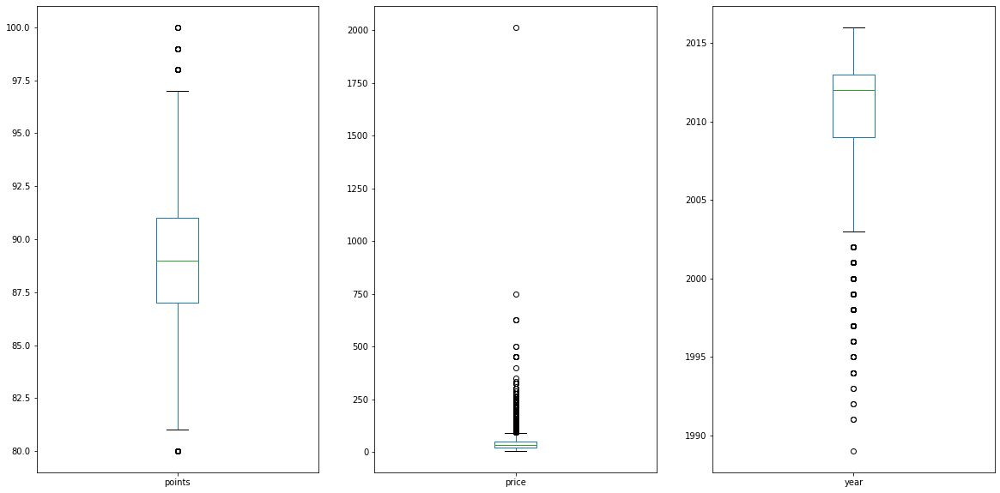

In [ ]:
data = df_wine_merge.copy()
numeric =  ['points','price','year']

fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20,10))
for nomor, kolom in enumerate(numeric):
  data.boxplot(kolom, ax=axes.flatten()[nomor],grid=False)
plt.show()

In [ ]:
Q1 = data['price'].quantile(0.25)
Q3 = data['price'].quantile(0.75)
IQR = Q3 - Q1

# Find Bottom Fence and Upper Fence
boxplot_min = Q1 - 1.5 * IQR
boxplot_max = Q3 + 1.5 * IQR
print(boxplot_max)

90.0


In [ ]:
data = df_wine_merge.copy()
data = df_wine_merge['price'].tolist()
type(data)
fig = ff.create_distplot([data], ['Wine Price'])
fig.update_layout(title_text="Wine Price Desity Distribution")
fig.show()

based on boxplot above:
* remove row that have points 100, because it perfect score maybe to subjectivty
* remove row that have price more than $1.000 because its too expensive
* remove row that wine year is older that 2002, because we dont have maturity data, maybe its not undrinkable and very hard too get

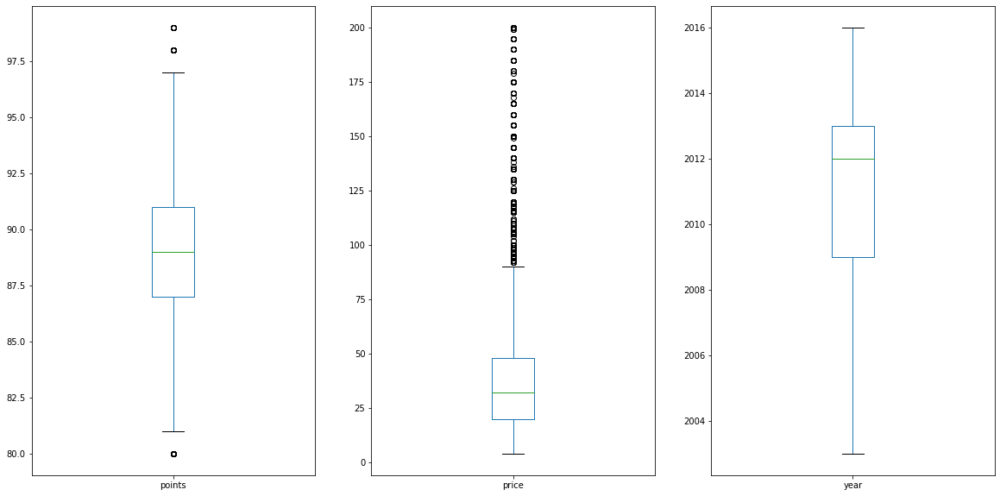

In [ ]:
df_wine_no_outlier = df_wine_merge.copy()
#get point below 100
filter = df_wine_no_outlier['points'] < 100
df_wine_no_outlier = df_wine_no_outlier.loc[(filter)]

#get wine price under 200
filter = df_wine_no_outlier['price'] <= 200
df_wine_no_outlier = df_wine_no_outlier.loc[(filter)]

#get wine year equal or above 2003
filter = df_wine_no_outlier['year'] >= 2003
df_wine_no_outlier = df_wine_no_outlier.loc[(filter)]

data = df_wine_no_outlier.copy()
numeric =  ['points','price','year']

fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20,10))
for nomor, kolom in enumerate(numeric):
  data.boxplot(kolom, ax=axes.flatten()[nomor],grid=False)
plt.show()

In [ ]:
df_wine_no_outlier['price'].describe()

count    44843.000000
mean        37.456794
std         23.757318
min          4.000000
25%         20.000000
50%         32.000000
75%         48.000000
max        200.000000
Name: price, dtype: float64

## Cluestering Price

These step goal is to make clustering in pricing for wine. it based on quantile but arrange a little, to make simplyfy for ease to use.

In [ ]:
df_wine_cluster = df_wine_no_outlier.copy()
data = df_wine_cluster['price'].tolist()
type(data)
fig = ff.create_distplot([data], ['Wine Price'])
fig.update_layout(title_text="Wine Price Density Distribution")
fig.show()

In [ ]:
df_wine_cluster = df_wine_no_outlier.copy()
df_wine_cluster['price'].quantile([0.2,0.4,0.6,0.8])
range = [0, 20, 35, 70, 100,200]

range_label = []
i=0
j=0
#print(len(range))
for value in range:
  if(i > 0):
    now = value
    before = range[i-1]
    if(i == (len(range)-1)):
      range_label.insert(j,">"+str(before))
    else:
      range_label.insert(j,str(before)+"-"+str(now))
    j+=1
  i+=1

range_label
#range_label = ['<25','25-40','40-75','75-150','150-250','>250']
df_wine_cluster["group_price"] = pd.cut(df_wine_cluster["price"],bins=range,labels=range_label, include_lowest=True)
df_wine_cluster["group_price"].value_counts().sort_index()

0-20      11281
20-35     14460
35-70     15701
70-100     2511
>100        890
Name: group_price, dtype: int64

In [ ]:
data = df_wine_cluster[['id','group_price']].copy()
data = data['group_price'].value_counts().sort_index()
#data['value'] = 1
fig = px.bar(data, y='group_price',text_auto=True,labels=dict(index="Group Price ($)", group_price="Wine count"))
fig.update_layout(title_text="Wine Price (Group) count")
fig.show()

In [ ]:
df_wine_clean = df_wine_cluster.copy()
#df_wine_clean.info()
df_wine_clean.rename(columns={'taster_twitter_handle':'twitter'}, inplace=True)
sorted_column = ['id','country','province','region_2','year','price',
                 'group_price','points','maturity','wine_type','variety',
                 'colors','winery','title','twitter','designation','description']

len(sorted_column)
df_wine_clean = df_wine_clean[sorted_column]

df_wine_clean =df_wine_clean.set_index('id')
df_wine_clean.head()
excel_data = df_wine_clean.copy()
file_name = 'wine_maturity_US_clean.xlsx'
  
# saving the excel
# excel_data.to_excel(file_name)
# print('DataFrame is written to Excel File successfully. Find it on File tab in left window, refresh it if needed')

In [ ]:
df_wine_clean['twitter'].value_counts()

No Account          15829
@vboone              8381
@paulgwine           7921
@mattkettmann        5656
@wawinereport        4300
@gordone_cellars     2597
@suskostrzewa         140
@laurbuzz              17
@winewchristina         2
Name: twitter, dtype: int64

#B. Wine Price, Point and Year

In this section, lets analyze relation between price, point and year more deep.

## PairPlot

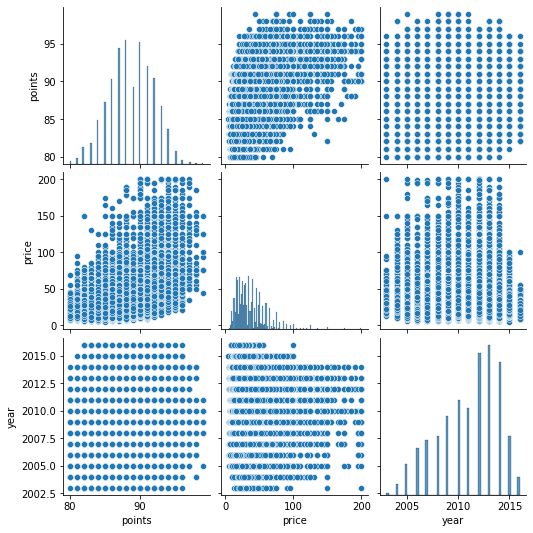

In [ ]:
data = df_wine_clean[['points','price','year']]
sns.pairplot(data)

**Price and Points**
* The higher the price, minimum point is higher. 
* The lower the price, maximum point is lower
* range in points between minimum and maximum is wide

**Price and Year**
* The newer wine, more cheaper
* old wine are cheaper
* wine with 2006 - 2012 have wide range for price

**Points and Year**
* We dont see any pattern between points and year
* if you heard someone say "The older the wine, more tasty", tell him/her "It just a myth" 

## Scatter Plot and Trendline

In [ ]:
data = df_wine_clean[['points','price','colors','wine_type','variety','year']]
fig = px.scatter(data, x="price", y="points", 
                 #trendline="ols",
                 #trendline_options=dict(log_x=True),
                 #trendline_scope="overall",
                 #color="year",
                 )
fig.show()

#model  = px.get_trendline_results(fig)
#results = model.iloc[0]["px_fit_results"].summary()
#print(results)

In [ ]:
data = df_wine_clean[['points','price','colors','wine_type','variety','year']]
fig = px.scatter(data, x="price", y="points", 
                 trendline="ols",
                 trendline_options=dict(log_x=True),
                 trendline_scope="overall",
                 #color="year",
                 )
fig.show()

model  = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"].summary()
print(results)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.298
Model:                            OLS   Adj. R-squared:                  0.298
Method:                 Least Squares   F-statistic:                 1.907e+04
Date:                Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                        11:51:07   Log-Likelihood:            -1.0644e+05
No. Observations:               44843   AIC:                         2.129e+05
Df Residuals:                   44841   BIC:                         2.129e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         78.4655      0.075   1043.797      0.0

Mostly our data are review wine that price < 70 and minimun points are 80. We can find point higher than 95 when price start is about 20.

If we compare the trendlines using Linear and Logarithmic. The R Square in Logarithmic is higher (0.298). its still not good enough to represent the formula about price and point though.

## Scatterplot with Aggeragate and Year

At scatterplot above, we see that there a wide range between price and point. So to make it more simple we will grouping the data with : Region, Variety, Group Price and Year, and we will get average value for points and price.

In [ ]:
data = df_wine_clean[['points','price','colors','wine_type','province','variety','region_2','year','group_price']]


group_by = ['region_2','variety','group_price','year']

agg_data_points = data.groupby(group_by,as_index=False)[['points']].mean()
agg_data_score = data.groupby(group_by,as_index=False)[['price']].mean()
agg_data = pd.merge(agg_data_points, agg_data_score, how='inner', left_on=group_by, right_on = group_by)
#remove NaN Value from merging data
agg_data = agg_data.dropna(axis=0,inplace=False)


fig = px.scatter(agg_data, x="price", y="points", 
                 trendline="ols",
                 trendline_options=dict(log_x=True),
                 trendline_scope="overall",
                 color="year",
                 color_continuous_scale="Inferno",
                 hover_name="group_price", hover_data=["year", "points",'price','variety','region_2']
                 )
fig.show()

model  = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"].summary()
print(results)


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.339
Model:                            OLS   Adj. R-squared:                  0.339
Method:                 Least Squares   F-statistic:                     3183.
Date:                Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                        11:51:08   Log-Likelihood:                -13708.
No. Observations:                6208   AIC:                         2.742e+04
Df Residuals:                    6206   BIC:                         2.743e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         78.7685      0.169    467.255      0.0

In [ ]:
data = df_wine_clean[['points','price','colors','wine_type','province','variety','region_2','year','group_price']]


group_by = ['region_2','variety','group_price','year']

agg_data_points = data.groupby(group_by,as_index=False)[['points']].mean()
agg_data_score = data.groupby(group_by,as_index=False)[['price']].mean()
agg_data = pd.merge(agg_data_points, agg_data_score, how='inner', left_on=group_by, right_on = group_by)
#remove NaN Value from merging data
agg_data = agg_data.dropna(axis=0,inplace=False)

def year_condition(wine_type):
    if wine_type >= 2012:
        return ">2012"
    elif (wine_type >= 2009) and (wine_type < 2012) :
        return "2009-2012"
    else:
        return 'old'
agg_data['year_group'] = agg_data.apply(lambda x: year_condition(x['year']), axis=1)

# # excel_data = df_wine[df_wine['country'] == 'US'].copy()
# excel_data = agg_data.copy()
# file_name = 'wine_group.xlsx'
  
# # saving the excel
# excel_data.to_excel(file_name)
# print('DataFrame is written to Excel File successfully. Find it on File tab in left window, refresh it if needed')
# # agg_data.info()

fig = px.scatter(agg_data, x="price", y="points", 
                 #trendline="ols",
                 #trendline_options=dict(log_x=True),
                 #trendline_scope="overall",
                 color="group_price",
                 color_discrete_sequence=["#f5531d", "#b53e16","#75280e","#4f1b09","#231f20"],
                 #color_continuous_scale="Inferno",
                 hover_name="group_price", hover_data=["year", "points",'price','variety','region_2']
                 )
fig.show()

# model  = px.get_trendline_results(fig)
# results = model.iloc[0]["px_fit_results"].summary()
# print(results)


In [ ]:
agg_data = agg_data.dropna(axis=0,inplace=False)
#agg_data.groupby('group_price')[['price','year','points']].describe()#[['count', 'mean']]
agg_data.groupby('group_price').agg([ 'count','mean','min','max']).T

group_price          0-20        20-35        35-70       70-100         >100
year   count  1969.000000  2209.000000  1416.000000   447.000000   167.000000
       mean   2010.580498  2010.511091  2010.201977  2010.111857  2009.838323
       min    2003.000000  2003.000000  2003.000000  2003.000000  2003.000000
       max    2016.000000  2016.000000  2016.000000  2016.000000  2014.000000
points count  1969.000000  2209.000000  1416.000000   447.000000   167.000000
       mean     86.602942    87.790110    89.311738    91.308434    92.744397
       min      80.000000    80.000000    80.000000    81.000000    84.000000
       max      93.000000    95.000000    96.000000    97.000000    98.000000
price  count  1969.000000  2209.000000  1416.000000   447.000000   167.000000
       mean     16.206852    27.557885    46.190359    82.388154   131.874883
       min       7.000000    21.000000    36.000000    72.000000   102.000000
       max      20.000000    35.000000    70.000000   100.000000   200.000000

**INSIGHT**

based on clustering the wine with group price, we can see that:
* The higher group price, the more high average point
* if we see the depth in Year in group price 0-20 and 20-35 we see newest wine give more point that the older wine
* The newer wine is more that older wine, so lets say what the newer wine are more easy to get in store. The most common is from 2010

# C. Wine Recommendation

## Filtering Good Wine each group
Based on EDA above, we will filter the wine using points and price. any points and price that above the average value. After that, we will rank them on each wine types, so we will best wine in each wine type and group price.

* 0-20 : Price < 16.2 And Points > 86.6
* 20-35 : Price < 27.5 And Points > 87.8
* 35-70 : Price < 46.2 And Points > 89.3
* 70-100 : Price < 82.4 And Points > 91.3
* '>100  : Price < 131.9 And Points > 92.7


In [ ]:
df_wine = df_wine_clean.copy()

### filtering by value
filter_group = '0-20'
filter_price = 16.2
filter_points = 86.6
temp = df_wine.loc[(df_wine['group_price'] == filter_group) & (df_wine['price'] < filter_price) & (df_wine['points'] > filter_points)]
df_wine_filter = temp


filter_group = '20-35'
filter_price = 27.5
filter_points = 87.8
temp = df_wine.loc[(df_wine['group_price'] == filter_group) & (df_wine['price'] < filter_price) & (df_wine['points'] > filter_points)]
df_wine_filter = pd.concat([df_wine_filter, temp])

filter_group = '35-70'
filter_price = 46.2
filter_points = 89.3
temp = df_wine.loc[(df_wine['group_price'] == filter_group) & (df_wine['price'] < filter_price) & (df_wine['points'] > filter_points)]
df_wine_filter = pd.concat([df_wine_filter, temp])

filter_group = '70-100'
filter_price = 82.4
filter_points = 91.3
temp = df_wine.loc[(df_wine['group_price'] == filter_group) & (df_wine['price'] < filter_price) & (df_wine['points'] > filter_points)]
df_wine_filter = pd.concat([df_wine_filter, temp])

filter_group = '>100'
filter_price = 131.9
filter_points = 92.7
temp = df_wine.loc[(df_wine['group_price'] == filter_group) & (df_wine['price'] < filter_price) & (df_wine['points'] > filter_points)]
df_wine_filter = pd.concat([df_wine_filter, temp])

df_wine_filter.head()

,country,province,region_2,year,price,group_price,points,maturity,wine_type,variety,colors,winery,title,twitter,designation,description
id,,,,,,,,,,,,,,,,
2,US,Oregon,Willamette Valley,2013,14.0,0-20,87,"Ready, at peak",Rich White,Pinot Gris,Whites,Rainstorm,Rainstorm 2013 Pinot Gris (Willamette Valley),@paulgwine,No Name,"Tart and snappy, the flavors of lime flesh and..."
14,US,California,Central Coast,2012,12.0,0-20,87,"Ready, at peak",Rich White,Chardonnay,Whites,Mirassou,Mirassou 2012 Chardonnay (Central Coast),@mattkettmann,No Name,Building on 150 years and six generations of w...
297,US,California,Napa,2008,15.0,0-20,87,"Can drink, maybe past peak",Bold Red,Cabernet Sauvignon,Reds,Aquinas,Aquinas 2008 Cabernet Sauvignon (Napa Valley),No Account,No Name,"This is a soft, gentle Cabernet for drinking n..."
301,US,Washington,Columbia Valley,2009,14.0,0-20,87,May be Undrinkable,Rich White,Chardonnay,Whites,Buried Cane,Buried Cane 2009 Whiteline No Oak Chardonnay (...,@paulgwine,Whiteline No Oak,"A good, clean, tart and lightly spicy all-stai..."
432,US,Washington,Columbia Valley,2014,16.0,0-20,89,"Can drink, maybe past peak",Sweet Wine,Riesling,Other,Pomum,Pomum 2014 Upland Vineyard Riesling (Snipes Mo...,@wawinereport,Upland Vineyard,"The aromas of whole lime, flowers, jasmine and..."


In [ ]:
data = df_wine_filter[['points','price','colors','wine_type','province','variety','region_2','year','group_price']].copy()


group_by = ['region_2','variety','group_price','year']

agg_data_points = data.groupby(group_by,as_index=False)[['points']].mean()
agg_data_score = data.groupby(group_by,as_index=False)[['price']].mean()
agg_data = pd.merge(agg_data_points, agg_data_score, how='inner', left_on=group_by, right_on = group_by)
#remove NaN Value from merging data
agg_data = agg_data.dropna(axis=0,inplace=False)


fig = px.scatter(agg_data, x="price", y="points", 
                 trendline="ols",
                 trendline_options=dict(log_x=True),
                 trendline_scope="overall",
                 color="year",
                 color_continuous_scale="YlOrRd",
                #  colorscale=[[0, 'rgb(255,255,255)'],
                #                           [0, 'rgb(255,250,228)'], 
                #                           [0.25, 'rgb(255,183,0)'], 
                #                           [0.75, 'rgb(172,121,0)'], 
                #                           [1, 'rgb(120,84,0)']],
                 hover_name="group_price", hover_data=["year", "points",'price','variety','region_2']
                 )
fig.show()

model  = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"].summary()
print(results)


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.669
Model:                            OLS   Adj. R-squared:                  0.669
Method:                 Least Squares   F-statistic:                     6515.
Date:                Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                        11:51:10   Log-Likelihood:                -5080.9
No. Observations:                3223   AIC:                         1.017e+04
Df Residuals:                    3221   BIC:                         1.018e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         80.3778      0.121    663.031      0.0

## Wine recommender using Rank

In [ ]:
df_wine_rank = df_wine_filter.copy()

## Lower price is better
df_wine_rank["rank_price"] = df_wine_rank.groupby(["group_price","variety"])["price"].rank(method="dense", ascending=True)
## higher points is better
df_wine_rank["rank_points"] = df_wine_rank.groupby(["group_price","variety"])["points"].rank(method="dense", ascending=False)
df_wine_rank['rank_price'] = df_wine_rank['rank_price'].astype(int)
df_wine_rank['rank_points'] = df_wine_rank['rank_points'].astype(int)

#calculated rank and find the smallest
df_wine_rank['rank'] = df_wine_rank['rank_points'] + df_wine_rank['rank_price']
df_wine_rank["approved"] = df_wine_rank.groupby(["group_price","variety"])["rank"].rank(method="dense", ascending=True)
df_wine_rank[df_wine_rank["approved"]<=2]
# df_wine_rank2 = df_wine_rank.groupby(['title','group_price','variety'],as_index=False)[['points']].mean()
# df_wine_rank3 = df_wine_rank.groupby(['title','group_price','variety'],as_index=False)[['price']].mean()
# df_wine_rank4 = df_wine_rank.groupby(['title','group_price','variety'],as_index=False)[['approved']].mean()

# df_wine_rank = pd.merge(df_wine_rank2, df_wine_rank3, how='inner', left_on=['title','group_price','variety'], right_on = ['title','group_price','variety'])
# df_wine_rank = pd.merge(df_wine_rank, df_wine_rank4, how='inner', left_on=['title','group_price','variety'], right_on = ['title','group_price','variety'])
# df_wine_rank = df_wine_rank.dropna(axis=0,inplace=False)
# df_wine_rank

,country,province,region_2,year,price,group_price,points,maturity,wine_type,variety,colors,winery,title,twitter,designation,description,rank_price,rank_points,rank,approved
id,,,,,,,,,,,,,,,,,,,,
7275,US,California,Sierra Foothills,2013,10.0,0-20,89,"Ready, at peak",Medium Red,Zinfandel,Reds,Montevina,Montevina 2013 Skyland Ridge Zinfandel (Amador...,@gordone_cellars,Skyland Ridge,"Meaty, spicy accents enliven this full-bodied ...",3,4,7,2.0
7803,US,Washington,Columbia Valley,2012,14.0,0-20,92,"Ready, at peak",Bold Red,Syrah,Reds,Waterbrook,Waterbrook 2012 Syrah (Columbia Valley (WA)),@wawinereport,No Name,"Blended with 12% Grenache and 8% Roussanne, th...",6,2,8,2.0
10386,US,Washington,Columbia Valley,2011,9.0,0-20,91,May be Undrinkable,Sweet Wine,Riesling,Other,Chateau Ste. Michelle,Chateau Ste. Michelle 2011 Riesling (Columbia ...,@paulgwine,No Name,"A marvelous effort in a difficult year, this t...",3,2,5,2.0
12931,US,California,Napa-Sonoma,2011,10.0,0-20,90,"Can drink, maybe past peak",Light Red,Pinot Noir,Reds,Kirkland Signature,Kirkland Signature 2011 Pinot Noir (Carneros),No Account,No Name,"For an amazing price you get a dry, silky and ...",3,3,6,2.0
13713,US,Washington,Columbia Valley,2012,10.0,0-20,90,"Can drink, not at peak",Dry White,Sauvignon Blanc,Whites,Bergevin Lane,Bergevin Lane 2012 Linen Sauvignon Blanc (Colu...,@paulgwine,Linen,"This lovely blend of Sauvignon Blanc, and 14% ...",3,3,6,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93691,US,California,North Coast,2004,130.0,>100,98,Not Found,Blended Wine,Sparkling Blend,Other,Schramsberg,Schramsberg 2004 J. Schram Rosé Sparkling (Nor...,No Account,J. Schram Rosé,"An awesome rosé, just a tremendous feat. Made ...",3,1,4,2.0
117837,US,California,North Coast,2006,110.0,>100,94,Not Found,Blended Wine,Champagne Blend,Other,Schramsberg,Schramsberg 2006 Reserve (North Coast),@gordone_cellars,Reserve,This compelling and delicious bottling has a g...,1,1,2,1.0
26658,US,California,Napa,2007,125.0,>100,93,Not Found,Blended Wine,Meritage,Other,William Hill Estate,William Hill Estate 2007 Meritage (Napa Valley),No Account,No Name,"Needs time in the cellar, as it's really tough...",1,1,2,1.0


In [ ]:
#find top 3 (some wine have same score)
df_wine_top = df_wine_rank[df_wine_rank["approved"]<=3]

data = df_wine_top.copy()
fig = px.scatter(data, x="price", y="points", 
                 trendline="ols",
                 trendline_options=dict(log_x=True),
                 trendline_scope="overall",
                 color='variety',
                 hover_name="group_price", hover_data=['title','price','points']
                 )
fig.show()

model  = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"].summary()
print(results)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.652
Model:                            OLS   Adj. R-squared:                  0.651
Method:                 Least Squares   F-statistic:                     2217.
Date:                Mon, 05 Dec 2022   Prob (F-statistic):          9.51e-274
Time:                        11:51:10   Log-Likelihood:                -2044.7
No. Observations:                1188   AIC:                             4093.
Df Residuals:                    1186   BIC:                             4104.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         82.4949      0.195    423.228      0.0

In [ ]:
df_wine_top.sort_values(by=['price','points'])

,country,province,region_2,year,price,group_price,points,maturity,wine_type,variety,colors,winery,title,twitter,designation,description,rank_price,rank_points,rank,approved
id,,,,,,,,,,,,,,,,,,,,
32942,US,Washington,Washington Other,2006,6.0,0-20,87,Not Found,Rich White,Chardonnay,Whites,Pine & Post,Pine & Post 2006 Chardonnay (Washington),@paulgwine,No Name,"Sharp, spicy, tastes of apples, with plenty of...",1,5,6,1.0
42959,US,California,Central Coast,2006,7.0,0-20,87,"Can drink, maybe past peak",Rich White,Chardonnay,Whites,Hilltown,Hilltown 2006 Chardonnay (Monterey County),No Account,No Name,"Sonoma Chard costing far more, this one showed...",2,5,7,2.0
127411,US,Washington,Columbia Valley,2011,7.0,0-20,88,May be Undrinkable,Sweet Wine,Riesling,Other,The Ghost in the Machine,The Ghost in the Machine 2011 Riesling (Columb...,@paulgwine,No Name,How do you make a Riesling this good and sell ...,1,5,6,3.0
1253,US,Washington,Washington Other,2006,7.0,0-20,88,Not Found,Rich White,Chardonnay,Whites,Washington Hills,Washington Hills 2006 Chardonnay (Washington),@paulgwine,No Name,The blend includes 6% Pinot Gris. This is a cr...,2,4,6,1.0
63697,US,Washington,Columbia Valley,2008,7.0,0-20,89,Not Found,Blended Wine,Red Blend,Other,Hogue,Hogue 2008 Red Table Wine Red (Columbia Valley...,@paulgwine,Red Table Wine,"Tart and juicy, this Cabernet/Merlot/Syrah ble...",1,3,4,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75946,US,California,Sonoma,2009,125.0,>100,96,May be Undrinkable,Rich White,Chardonnay,Whites,Del Dotto,Del Dotto 2009 Cinghiale Vineyard Family Reser...,No Account,Cinghiale Vineyard Family Reserve,"Rich and complex, this dry, terroir-driven win...",3,1,4,2.0
92451,US,Washington,Columbia Valley,2005,125.0,>100,97,Not Found,Blended Wine,Red Blend,Other,Leonetti Cellar,Leonetti Cellar 2005 Reserve Red Wine Red (Wal...,@paulgwine,Reserve Red Wine,The 2005 Leonetti Reserve is all estate vineya...,2,1,3,1.0
83353,US,California,Napa,2008,125.0,>100,98,Not Found,Blended Wine,Bordeaux-style Red Blend,Other,Von Strasser,Von Strasser 2008 Reserve Red (Diamond Mountai...,No Account,Reserve,"As good as the winery's other 2008s are, this ...",4,1,5,3.0


In [ ]:
fig = px.histogram(df_wine_top.sort_values(by=['points']), x="points", y="title", orientation='h', color='variety')
fig.show()

# D Wine Characteristic

To get characteristic the wine in each variety, we will find what words that used in column description. Data used in this will be all cleaned wine data. Because there many variety, we will filter it by Top 10 based on how many review data.

## Preparing

In [ ]:
#Find unique value in variety column
#df_wine_chara = df_wine_filter.copy()
df_wine_chara = df_wine_clean.copy()
#find top variety wine based on quantity
top_variety = 10

variety = df_wine_chara['variety'].value_counts().head(top_variety).index

df_wine_chara = df_wine_chara.loc[df_wine_chara['variety'].isin(variety)]
df_wine_chara['variety'].value_counts()
#df_wine_chara[(df_wine_chara['variety']=='Zinfandel') & (df_wine_chara['price']>50)]

Pinot Noir                  8742
Cabernet Sauvignon          6756
Chardonnay                  6163
Syrah                       3058
Red Blend                   2499
Zinfandel                   2382
Merlot                      2055
Sauvignon Blanc             1854
Bordeaux-style Red Blend    1641
Riesling                    1547
Name: variety, dtype: int64

In [ ]:
## Grouping by variety and description
## output will be, variety, concated description, total value
df_wine_chara['wine_count'] = 1
#df_wine_chara
df_wine_chara['group_price'] = df_wine_chara['group_price'].astype(str)
df_agg_variety = df_wine_chara.groupby(['variety'],as_index=False).agg({'description': ' '.join, 'wine_count': 'sum'})
df_agg_variety
#df_wine_chara.info()
df_agg_price = df_wine_chara.groupby(['variety','group_price'],as_index=False).agg({'price': 'mean','points':'mean'})

df_agg_variety.sort_values(by=['wine_count'], ascending=False)
df_agg_variety

,variety,description,wine_count
0,Bordeaux-style Red Blend,Deftly calibrating sultry black fruit against ...,1641
1,Cabernet Sauvignon,"Soft, supple plum envelopes an oaky structure ...",6756
2,Chardonnay,Building on 150 years and six generations of w...,6163
3,Merlot,"A fairly elegant expression of the variety, th...",2055
4,Pinot Noir,"Much like the regular bottling from 2012, this...",8742
5,Red Blend,"Very deep in color and spicy-smoky in flavor, ...",2499
6,Riesling,A wisp of bramble extends a savory tone from n...,1547
7,Sauvignon Blanc,"This shows a tart, green gooseberry flavor tha...",1854
8,Syrah,"Dark and thick in the glass, this wine shows s...",3058
9,Zinfandel,A healthy addition of 13% Petite Sirah provide...,2382


In [ ]:
###cleaning the words,
### to make sure the wordcloud result is not ambiguous from 1 word 
df_agg_variety['description'] = df_agg_variety['description'].str.lower()
df_agg_variety['description'] = df_agg_variety['description'].str.replace('black pepper', 'blackpepper')
df_agg_variety['description'] = df_agg_variety['description'].str.replace('black currant', 'blackcurrant')
df_agg_variety['description'] = df_agg_variety['description'].str.replace('black berry', 'blackberry')

In [ ]:
hasil = df_agg_variety.copy()

group_price = ['0-20','20-35','35-70','70-100','>100']
for grp in group_price:
  col_name1 = grp+'_avg_price'
  col_name2 = grp+'_avg_points'
  temp = df_agg_price[df_agg_price['group_price'] == grp]
  hasil = pd.merge(hasil,temp[['variety','price','points']],on=['variety'], how='left')
  hasil.rename(columns={'price':grp+'_avg_price'}, inplace=True)
  hasil.rename(columns={'points':grp+'_avg_points'}, inplace=True)

df_agg = hasil.copy()
df_agg.rename(columns={'description':'full_description'}, inplace=True)
df_agg['full_description'].values[0]

"deftly calibrating sultry black fruit against savory earth tones, this blend of merlot, cabernet sauvignon and cabernet franc offers refinement. toast, smoke and bramble integrate amid black plum and cherry flavors. the finish is powerful and persistent, fringed with finely grained tannins. this wine—the first vineyard-designate to come out of this young site—is 51% cabernet sauvignon, 27% cabernet franc and 22% merlot. it takes time to get going but once it does, it provides generous aromas and flavors of coffee, vanilla, herbs, plum and cherry along with lightly grainy tannins. the precision and elegance the winery is known for is on full display. this blend of cabernet sauvignon and merlot is as sweet as a candy. it has licorice, cherry, sweet cola and persimmon flavors. a blend of the five major bordeaux varieties, this is a deliciously soft wine. so easy to like for its rich blackberry, cherry, raspberry and smoky oak flavors, courtesy of 40% new barrels. shows lots of class for 

## Wordcloud

In [ ]:
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import requests


dictionary = set(STOPWORDS)
additional_stopwords = ['wine', "bottle", "glass", "grapes", "pour", "sip", "taste", "flavors", "show", "finish", "note","aroma","aromas","ripe",
                        "palate","note","notes","texture","bottle","bottling","bottles","nose","fruit","shows","good","well","year","years","now","black"]

bg_color="#e1e0d5"
bg_color=str(bg_color)

con_color = "#341106"
con_color=str(con_color)

cm_color="copper_r"
cm_color=str(cm_color)


mask_shape = np.array(Image.open(requests.get("https://i.ibb.co/fCJW48n/bottle.png", stream=True).raw))
#mask_shape = np.array(Image.open('/content/drive/MyDrive/Data Analytics/RevoU/GFP - Wine Tasting/wordcloud/bottle.png'))
mask_shape

#add stopwords with variety 
#split text with space and -
#for i in range(10): #not working, Phyton bug maybe?
varn = 0
for i in (df_agg['variety']):
  #print(counter)
  words = df_agg['variety'].str.lower().values[varn]
  words = words.replace("-"," ")
  clean_words = words.split()
  variety = list(variety) + list(clean_words)
  varn += 1

stopwords = additional_stopwords + list(dictionary) + list(variety)

###### FLAG TO UPDATE THE DATAFRAME
###### SET TO True IF WANT TO UPDATE
add_to_df = True


df_wordcloud = pd.DataFrame(columns = ['variety', 'wordcloud', 'wine_count','top_5','top_10','top_15'])
row_wordcloud = pd.DataFrame(columns = ['variety', 'wordcloud', 'wine_count','top_5','top_10','top_15'])

### 0-Bordeaux-style Red Blend

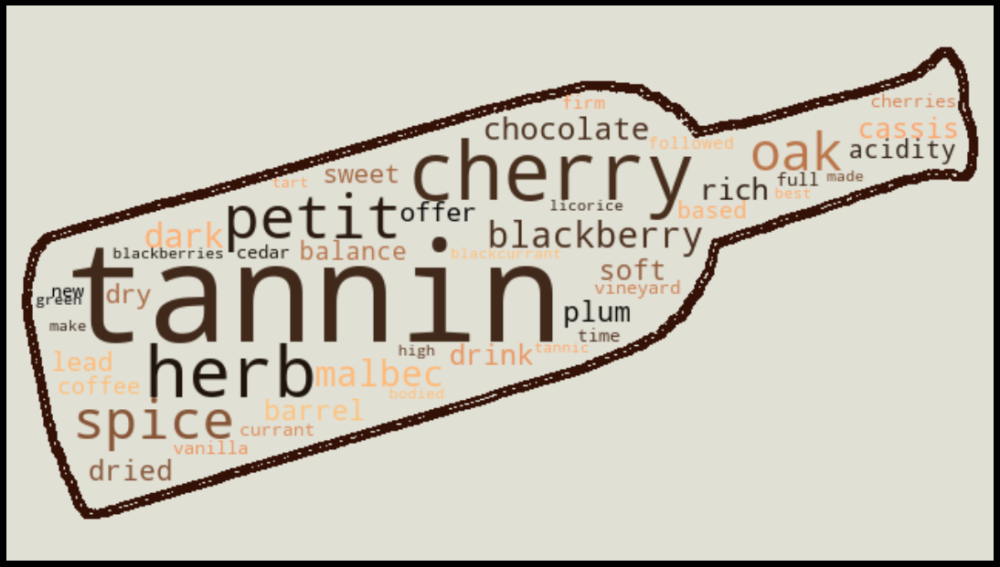

In [ ]:
varn = 0
extra_stop_words = ["franc","verdot","black"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

### 1-Cabernet Sauvignon

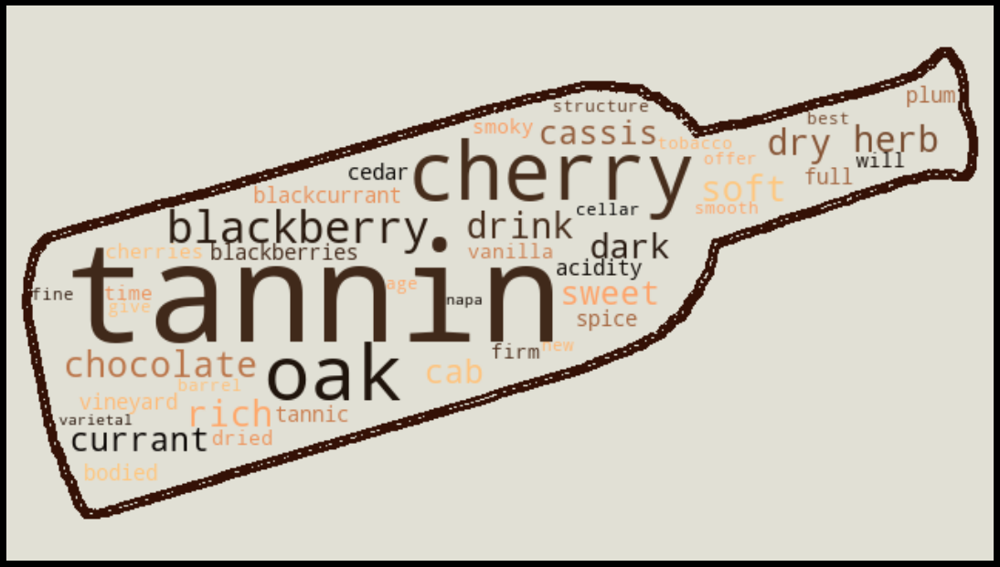

In [ ]:
varn = 1
extra_stop_words = ["franc","verdot","black"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

### 2-Chardonnay

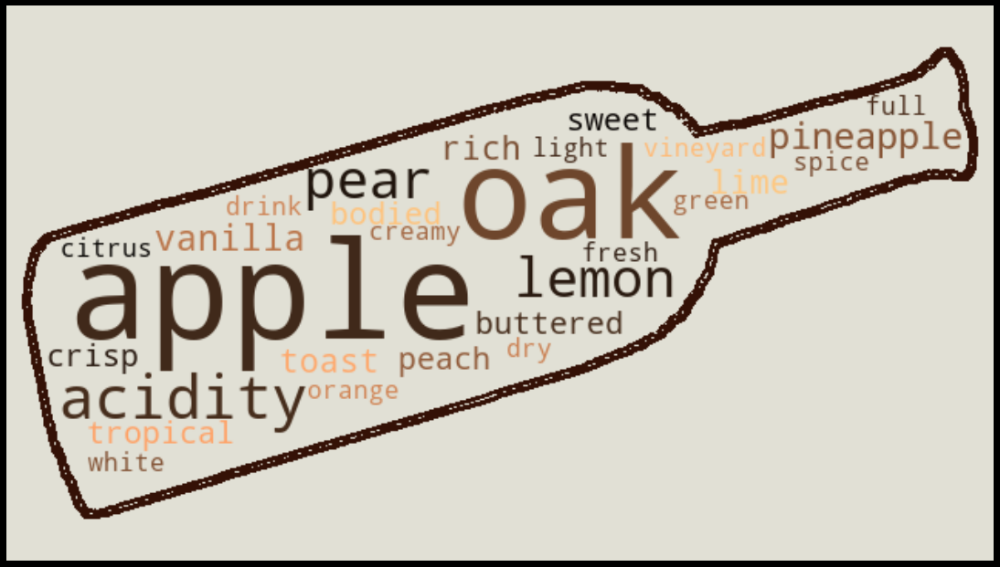

In [ ]:
varn = 2
extra_stop_words = ["franc","verdot","black"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

### 3-Merlot

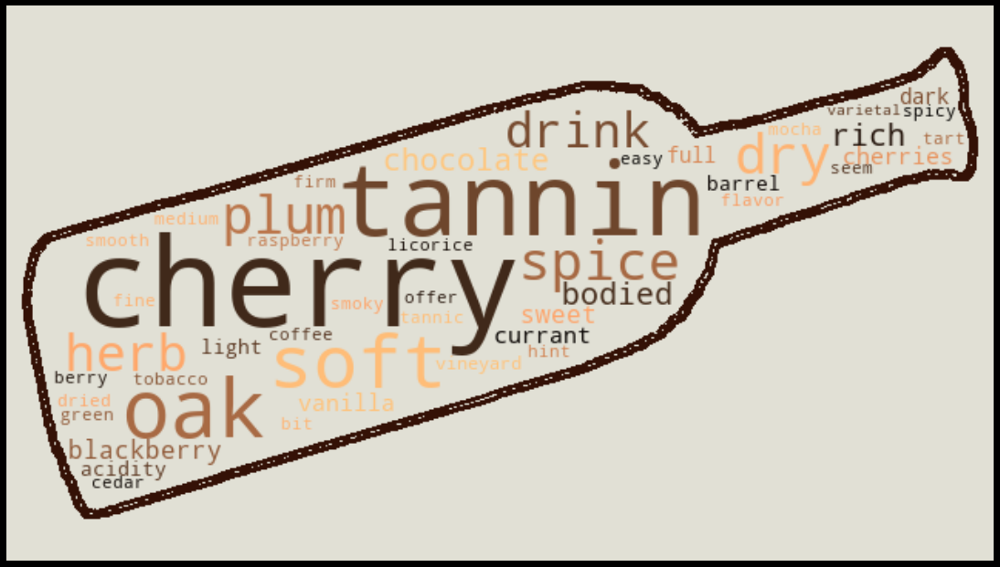

In [ ]:
varn = 3
extra_stop_words = ["franc","verdot","black"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

### 4-Pinot Noir

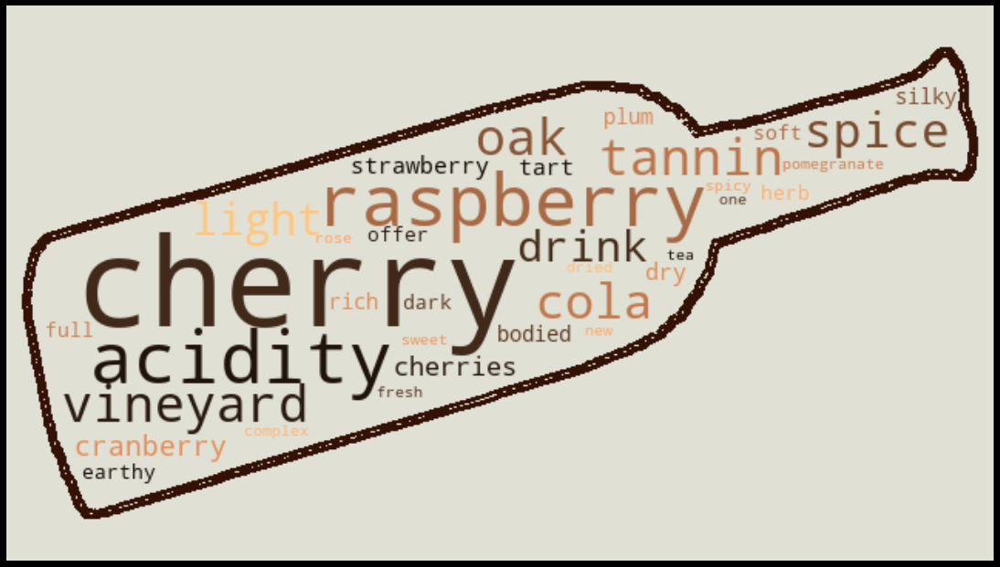

In [ ]:
varn = 4
extra_stop_words = ["franc","verdot","black"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

### 5-Red Blend

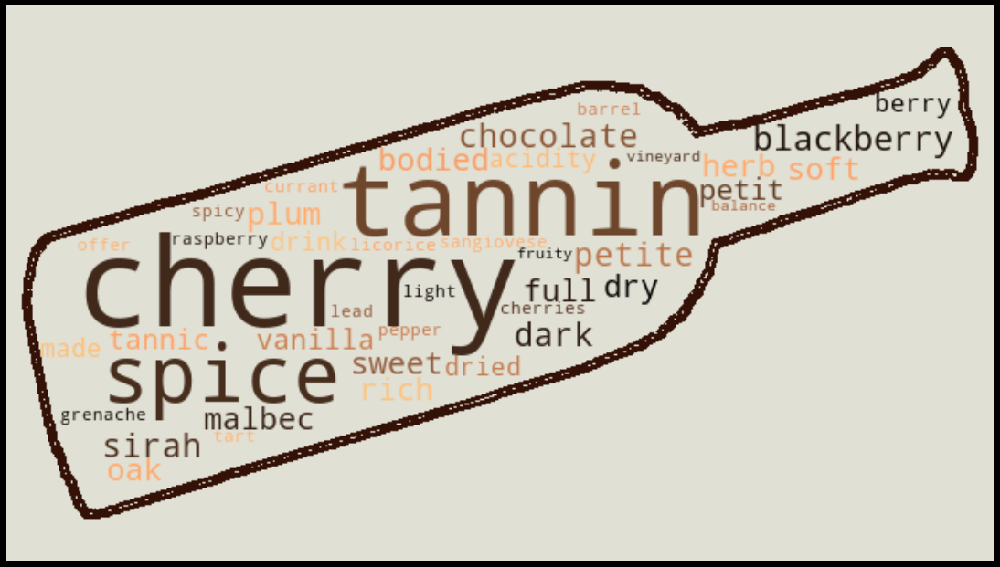

In [ ]:
varn = 5
extra_stop_words = ["franc","verdot","black"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

### 6-Riesling

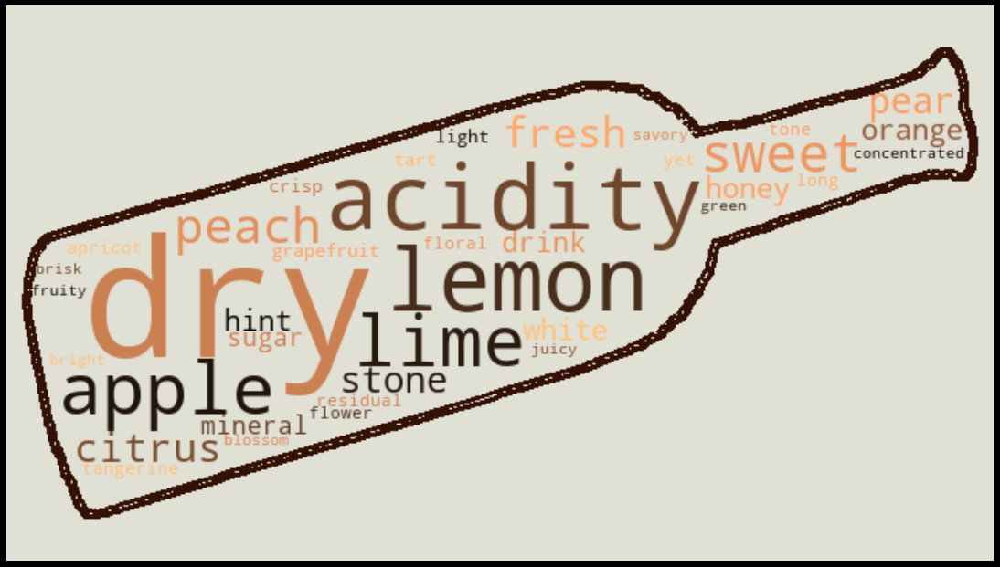

In [ ]:
varn = 6
extra_stop_words = ["franc","verdot","black"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

### 7-Sauvignon Blanc

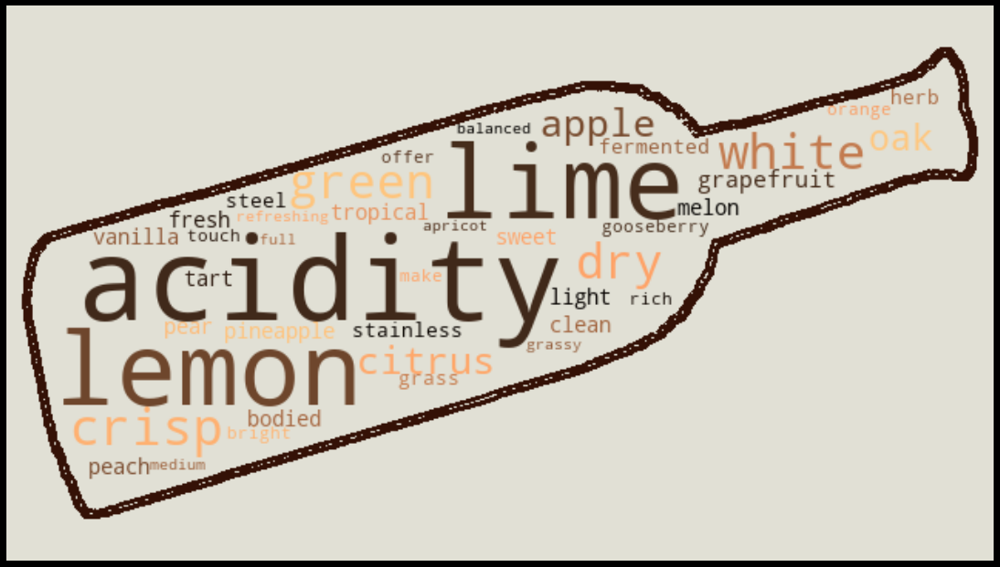

In [ ]:
varn = 7
extra_stop_words = ["franc","verdot","black"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

### 8-Syrah

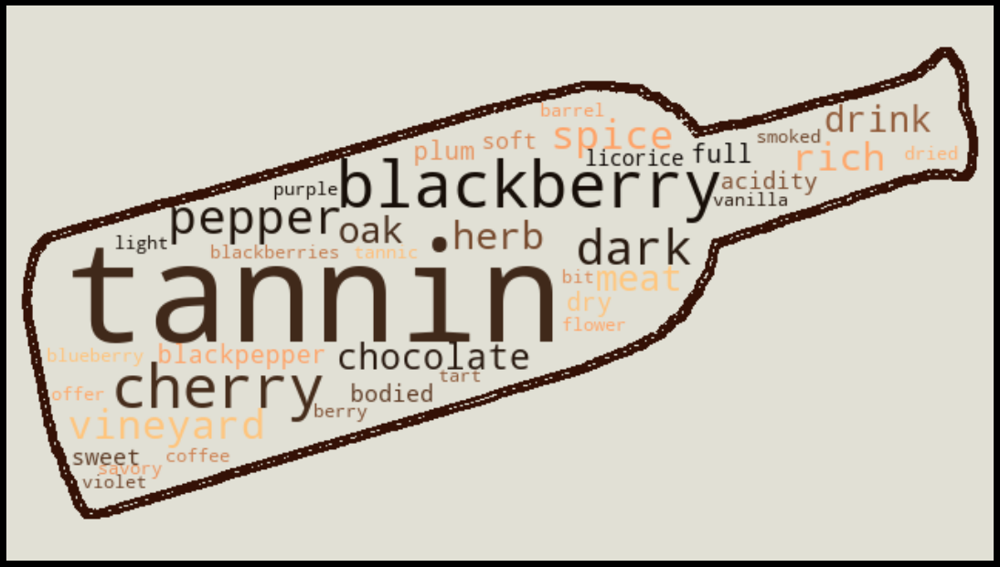

In [ ]:
varn = 8
extra_stop_words = ["franc","verdot","black"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

### 9-Zinfandel

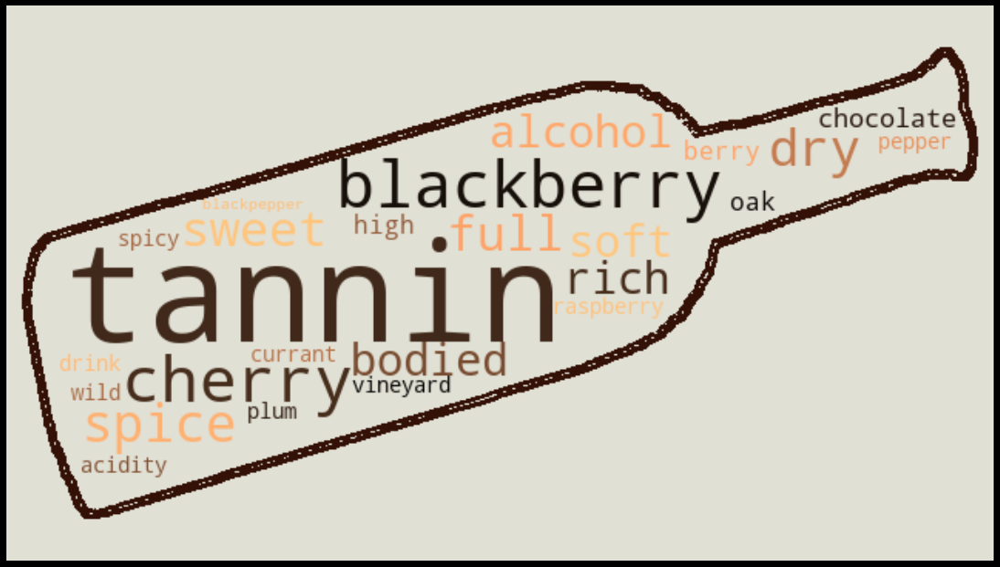

In [ ]:
varn = 9
extra_stop_words = ["franc","verdot","black","zin"]
stopwords = stopwords + list(extra_stop_words)
full_text = df_agg['full_description'].str.lower().values[varn]

wordcloud = WordCloud(width = 1600, height = 900,
                background_color =bg_color,
                stopwords = stopwords,
                max_words=300,
                max_font_size=150,
                random_state=5,
                prefer_horizontal=1,
                collocations=False,
                mask = mask_shape,
                contour_width=3, 
                contour_color=con_color,
                colormap=cm_color,
                min_font_size = 10).generate(full_text)

plt.figure(figsize = (15, 15), facecolor = "k")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

#### append the data
row_wordcloud = pd.DataFrame({"variety":[df_agg['variety'].values[varn]],
                              "wordcloud":[', '.join(list(wordcloud.words_.keys()))],
                              "wine_count":df_agg['wine_count'].values[varn],
                              "top_5":', '.join(list(wordcloud.words_.keys())[:5]),
                              "top_10":', '.join(list(wordcloud.words_.keys())[:10]),
                              "top_15":', '.join(list(wordcloud.words_.keys())[:15])
                              })
if (add_to_df == True):
  df_wordcloud = pd.concat([df_wordcloud,row_wordcloud])

In [ ]:
df_wordcloud = df_wordcloud.reset_index()
df_wordcloud.drop('index', axis=1, inplace=True)
#df_wordcloud.drop('level_0', axis=1, inplace=True)
df_wordcloud

,variety,wordcloud,wine_count,top_5,top_10,top_15
0,Bordeaux-style Red Blend,"tannin, cherry, herb, petit, spice, oak, black...",1641,"tannin, cherry, herb, petit, spice","tannin, cherry, herb, petit, spice, oak, black...","tannin, cherry, herb, petit, spice, oak, black..."
1,Cabernet Sauvignon,"tannin, cherry, oak, blackberry, dry, chocolat...",6756,"tannin, cherry, oak, blackberry, dry","tannin, cherry, oak, blackberry, dry, chocolat...","tannin, cherry, oak, blackberry, dry, chocolat..."
2,Chardonnay,"apple, oak, acidity, pear, lemon, pineapple, v...",6163,"apple, oak, acidity, pear, lemon","apple, oak, acidity, pear, lemon, pineapple, v...","apple, oak, acidity, pear, lemon, pineapple, v..."
3,Merlot,"cherry, tannin, oak, soft, spice, dry, plum, h...",2055,"cherry, tannin, oak, soft, spice","cherry, tannin, oak, soft, spice, dry, plum, h...","cherry, tannin, oak, soft, spice, dry, plum, h..."
4,Pinot Noir,"cherry, raspberry, acidity, vineyard, oak, tan...",8742,"cherry, raspberry, acidity, vineyard, oak","cherry, raspberry, acidity, vineyard, oak, tan...","cherry, raspberry, acidity, vineyard, oak, tan..."
5,Red Blend,"cherry, tannin, spice, blackberry, dark, choco...",2499,"cherry, tannin, spice, blackberry, dark","cherry, tannin, spice, blackberry, dark, choco...","cherry, tannin, spice, blackberry, dark, choco..."
6,Riesling,"dry, acidity, lemon, apple, lime, sweet, peach...",1547,"dry, acidity, lemon, apple, lime","dry, acidity, lemon, apple, lime, sweet, peach...","dry, acidity, lemon, apple, lime, sweet, peach..."
7,Sauvignon Blanc,"acidity, lemon, lime, crisp, white, green, dry...",1854,"acidity, lemon, lime, crisp, white","acidity, lemon, lime, crisp, white, green, dry...","acidity, lemon, lime, crisp, white, green, dry..."
8,Syrah,"tannin, blackberry, cherry, pepper, dark, vine...",3058,"tannin, blackberry, cherry, pepper, dark","tannin, blackberry, cherry, pepper, dark, vine...","tannin, blackberry, cherry, pepper, dark, vine..."
9,Zinfandel,"tannin, blackberry, cherry, spice, dry, sweet,...",2382,"tannin, blackberry, cherry, spice, dry","tannin, blackberry, cherry, spice, dry, sweet,...","tannin, blackberry, cherry, spice, dry, sweet,..."


In [ ]:
df_wine_rank

,country,province,region_2,year,price,group_price,points,maturity,wine_type,variety,colors,winery,title,twitter,designation,description,rank_price,rank_points,rank,approved
id,,,,,,,,,,,,,,,,,,,,
2,US,Oregon,Willamette Valley,2013,14.0,0-20,87,"Ready, at peak",Rich White,Pinot Gris,Whites,Rainstorm,Rainstorm 2013 Pinot Gris (Willamette Valley),@paulgwine,No Name,"Tart and snappy, the flavors of lime flesh and...",6,7,13,9.0
14,US,California,Central Coast,2012,12.0,0-20,87,"Ready, at peak",Rich White,Chardonnay,Whites,Mirassou,Mirassou 2012 Chardonnay (Central Coast),@mattkettmann,No Name,Building on 150 years and six generations of w...,7,5,12,7.0
297,US,California,Napa,2008,15.0,0-20,87,"Can drink, maybe past peak",Bold Red,Cabernet Sauvignon,Reds,Aquinas,Aquinas 2008 Cabernet Sauvignon (Napa Valley),No Account,No Name,"This is a soft, gentle Cabernet for drinking n...",8,6,14,8.0
301,US,Washington,Columbia Valley,2009,14.0,0-20,87,May be Undrinkable,Rich White,Chardonnay,Whites,Buried Cane,Buried Cane 2009 Whiteline No Oak Chardonnay (...,@paulgwine,Whiteline No Oak,"A good, clean, tart and lightly spicy all-stai...",9,5,14,9.0
432,US,Washington,Columbia Valley,2014,16.0,0-20,89,"Can drink, maybe past peak",Sweet Wine,Riesling,Other,Pomum,Pomum 2014 Upland Vineyard Riesling (Snipes Mo...,@wawinereport,Upland Vineyard,"The aromas of whole lime, flowers, jasmine and...",10,4,14,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93607,US,California,Napa-Sonoma,2005,125.0,>100,94,Not Found,Bold Red,Cabernet Sauvignon,Reds,Pride Mountain,Pride Mountain 2005 Reserve Cabernet Sauvignon...,No Account,Reserve,"This is the densest, most tannic of Pride's ne...",10,6,16,12.0
107868,US,California,Central Coast,2013,125.0,>100,93,Not Found,Bold Red,Cabernet Sauvignon,Reds,Sextant,Sextant 2013 El Pomar Estate Cabernet Sauvigno...,@mattkettmann,El Pomar Estate,"Deep-dark chocolate, concentrated boysenberry,...",10,7,17,13.0
113863,US,California,Central Coast,2013,119.0,>100,93,Not Found,Bold Red,Cabernet Sauvignon,Reds,HammerSky,HammerSky 2013 Straight de Barrel Cabernet Sau...,@mattkettmann,Straight de Barrel,Sold in a squat bottle that looks like it's fr...,8,7,15,11.0


## Exporting to Excel

In [ ]:
sheet1 = df_wordcloud.copy()
sheet2 = df_wine_rank.copy()
file_name = 'wine_characteristic_rank.xlsx'
  
# # saving the excel
#excel_data.to_excel(file_name)
with pd.ExcelWriter(file_name) as writer:  
    sheet1.to_excel(writer, sheet_name='WordCloud')
    sheet2.to_excel(writer, sheet_name='WineRank')
print('DataFrame is written to Excel File successfully. Find it on File tab in left window, refresh it if needed')

DataFrame is written to Excel File successfully. Find it on File tab in left window, refresh it if needed


# SCRATCH CODING

In [ ]:
df = pd.DataFrame({"a":["hello this is a test white blue yellow currant"],
                         "b":["hello this is a test white blue yellow currant"]})


df['a'] = df['a'].str.replace('currant', 'blackcurrant')
df

,a,b
0,hello this is a test white blue yellow blackcu...,hello this is a test white blue yellow currant


In [ ]:
df_wine_group = df_wine_clean.copy()

group_1 = ['Pinot Noir','Chardonnay','Syrah','Grenache']
group_2 = ['Cabernet Sauvignon','Zinfadel']

def variety_condition(variety):
    if variety in group_1:
        return "Group 1"
    elif variety in group_2:
        return "Group 2"
    else:
        return variety

df_wine_group['variety_group'] = df_wine_group.apply(lambda x: variety_condition(x['variety']), axis=1)


data = df_wine_group[['points','price','colors','wine_type','variety','variety_group']]
fig = px.scatter(data, x="price", y="points", 
                 trendline="ols",
                 trendline_options=dict(log_x=True),
                 trendline_scope="overall",
                 color="variety_group",
                 marginal_x="histogram", 
                 marginal_y="histogram"
                 )
fig.show()

model  = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"].summary()
# alpha = results.params[0]
# beta = results.params[1]
# p_beta = results.pvalues[1]
# r_squared = results.rsquared

print(results)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.298
Model:                            OLS   Adj. R-squared:                  0.298
Method:                 Least Squares   F-statistic:                 1.907e+04
Date:                Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                        11:51:29   Log-Likelihood:            -1.0644e+05
No. Observations:               44843   AIC:                         2.129e+05
Df Residuals:                   44841   BIC:                         2.129e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         78.4655      0.075   1043.797      0.0

In [ ]:
df_wine = df_wine_clean.copy()
fig = px.density_heatmap(df_wine, 
                        x="price", y="points", 
                        nbinsx=100, nbinsy=50,
                        #marginal_x="histogram", marginal_y="histogram",
                        color_continuous_scale="OrRd",
                        #facet_row="wine_type"
                        )
fig.show()

In [ ]:
import plotly.graph_objects as go
df_wine = df_wine_clean.copy()

#df_wine= df_wine[df_wine['colors'] == 'Whites']
#rgba(255,255,255,1) 0%, rgba(255,183,0,1) 15%, rgba(172,121,0,1) 60%, rgba(120,84,0,1) 100%
xx =df_wine['price'].tolist()
xx.insert(999998, 200)
xx.insert(999999, 0)
yy =df_wine['points'].tolist()
yy.insert(999998, 100)
yy.insert(999999, 70)

XX = df_wine['price']+200
fig = go.Figure(go.Histogram2d(x=xx, y=yy, 
                              nbinsx=100, nbinsy=50,
                              colorscale=[[0, 'rgb(255,255,255)'],
                                          [0, 'rgb(255,250,228)'], 
                                          [0.25, 'rgb(255,183,0)'], 
                                          [0.75, 'rgb(172,121,0)'], 
                                          [1, 'rgb(120,84,0)']],
                              
                              ))
#fig.update(layout_yaxis_range = [50,100])
fig.show()